In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import re
import json
from scipy import ndimage
import itertools

# first try in lab

In [2]:
img_data = np.loadtxt("onlydata.csv", delimiter=", ")

In [3]:
reshaped = img_data.reshape((480,640,3))

In [4]:
new = 255 -reshaped[:,:,[2,1,0]]

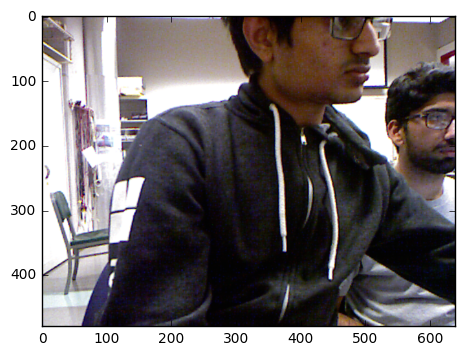

In [5]:
plt.imshow(new)
plt.show()

# got more data

In [31]:
filename = "/home/girish/Documents/data/ee106a/red_folder_debug.txt"
textfile = open(filename, 'r')
filetext = textfile.read()
textfile.close()

print("Length of file: ")
print(len(filetext))

matches = re.findall("data\: \[[^\]]+\]", filetext)

str_arrays = [i[6:] for i in matches]

print("Number of frames: ")
print(len(str_arrays))

int_arrays = [np.array(json.loads(i)) for i in str_arrays]

Length of file: 
91985276
Number of frames: 
23


In [32]:
def disp_img_plt(arr):
    #colored_reshaped_img = arr[:,:,[2,1,0]] / 255
    plt.imshow(arr / 255)
    plt.show()
def conv_img(img):
    return img[:,:,[2,1,0]]

## using opencv

### trying to use red color filtering to get folder isolated - and then get contours [not working yet]

#### alternative approach

In [33]:
def dist(pt1, pt2):
    return ((pt1[0] - pt2[0]) ** 2 + (pt1[1] - pt2[1]) ** 2) ** .5
def gen_rect(cnt):
    cnt = cnt.reshape((cnt.shape[0], 2))
    points = []
    
    max_x = np.argmax(cnt[:,0])
    points.append(cnt[max_x])
    
    max_xpy = np.argmax(cnt[:,0] + cnt[:,1])
    points.append(cnt[max_xpy])
    
    max_y = np.argmax(cnt[:,1])
    points.append(cnt[max_y])
    
    max_nxpy = np.argmax(-cnt[:,0] + cnt[:,1])
    points.append(cnt[max_nxpy])
    
    max_nx = np.argmax(-cnt[:,0])
    points.append(cnt[max_nx])
    
    max_nxpny = np.argmax(-cnt[:,0] - cnt[:,1])
    points.append(cnt[max_nxpny])
    
    max_ny = np.argmax(-cnt[:,1])
    points.append(cnt[max_ny])
    
    max_xpny = np.argmax(cnt[:,0] - cnt[:,1])
    points.append(cnt[max_xpny])
    
    edges = [(dist(points[i], points[(i + 1) % 8]), points[i], points[(i + 1) % 8]) for i in range(8)]
        
    # maximum 28 points 8 C 2
    #edges = [(dist(pts[0], pts[1]), pts[0], pts[1]) for pts in itertools.combinations(points, 2)]
    #sorted_edges = sorted(edges, key=lambda x: x[0])
    #return [(p[1], p[2]) for p in sorted_edges[-4:]], np.array(points).reshape((8,1,2))
    final_edges = []
    for i in range(4):
        if edges[2 * i][0] > edges[2 * i + 1][0]:
            longer_edge = edges[2 * i]
            final_edges.append((longer_edge[1], longer_edge[2]))
        else:
            longer_edge = edges[2 * i + 1]
            final_edges.append((longer_edge[1], longer_edge[2]))
    return final_edges

# get intersection of ordered edges
def get_corners(edges):
    corners = []
    for i in range(4):
        curr_edge = edges[i]
        next_edge = edges[(i + 1) % 4]
        corners.append(get_corner(curr_edge, next_edge))
    return np.array(corners)

# return m, b
def get_line(p1, p2):
    x1 = p1[0]
    y1 = p1[1]
    x2 = p2[0]
    y2 = p2[1]
    m = (y2 - y1)/(x2 - x1)
    b = y1 - m * x1
    return (m, b)

def get_corner(pts1, pts2):
    m1, b1 = get_line(pts1[0], pts1[1])
    m2, b2 = get_line(pts2[0], pts2[1])
    x = (b1 - b2) / (m2 - m1)
    y = m1 * x + b1
    return [int(x), int(y)]


In [34]:
def kmeans(pts, num_iters = 20):
    pts = pts.reshape((pts.shape[0], 2)) * 10
    lines = {}
    npts = pts.shape[0]
    corr_pts = {0 : list(range(npts//4)),
                1 : list(range(npts//4, npts//2)),
                2 : list(range(npts//2, 3*npts//4)),
                3 : list(range(3*npts//4, npts)) }
    
    for _ in range(num_iters):
        # find 'centroid'
        for i in range(4):
            if len(corr_pts[i]) > 0:
                curr_pts = pts[corr_pts[i]]
                line = solve(curr_pts)
                lines[i] = line[0]
        #print("LLLLLLLLLLLL")
        #for i in range(4):
        #    print("Line: " + str(i), lines[i])
        #    print("Corr_pts: " + str(i), corr_pts[i])
        corr_pts = {0:[], 1:[], 2:[], 3:[]}
        for pt_num in range(len(pts)):
            pt = pts[pt_num]
            x,y = pt
            lowest_err = float('inf')
            best_line = None
            for i in range(4):
                m, b = lines[i]
                y_est = m * x + b
                curr_err = np.linalg.norm(y - y_est)
                if curr_err < lowest_err:
                    lowest_err = curr_err
                    best_line = i
            corr_pts[best_line].append(pt_num)
    return lines
        
    
def solve(d):
    y = d[:,1]
    x = d[:,0]
    x = x.reshape((x.shape[0], 1))
    x = np.hstack((x, np.ones(x.shape)))
    return np.linalg.lstsq(x,y)

In [35]:
npts = 20
corr_pts = {0 : list(range(npts//4)),
            1 : list(range(npts//4, npts//2)),
            2 : list(range(npts//2, 3*npts//4)),
            3 : list(range(3*npts//4, npts)) }

a = np.array([[1,2],
              [3,4],
              [4,3],
              [1,3]
             ])
b = a[[1,2]]
b[0,0] = 10
print(a)
print(b)
np.linalg.lstsq([[2,1]], [4])

[[1 2]
 [3 4]
 [4 3]
 [1 3]]
[[10  4]
 [ 4  3]]


(array([ 1.6,  0.8]), array([], dtype=float64), 1, array([ 2.23606798]))

#### prod code to get the folder center

In [36]:
def find_target_center(image_data):
    img_cv = np.uint8(image_data.reshape((480,640,3)))
    og_img_cv = img_cv.copy()
    hsv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2HSV)


    # first mask
    lower_red_0 = np.array([0,128,0])
    upper_red_0 = np.array([10,255,255])
    mask_0 = cv2.inRange(hsv, lower_red_0, upper_red_0)

    # second mask
    lower_red_1 = np.array([160,128,0])
    upper_red_1 = np.array([180,255,255])
    mask_1 = cv2.inRange(hsv, lower_red_1, upper_red_1)

    mask = cv2.bitwise_or(mask_0, mask_1)

    res = cv2.bitwise_or(img_cv,img_cv, mask= mask)
    blurred = cv2.GaussianBlur(mask, (11, 11), 0)
    thresh = cv2.threshold(blurred, 70, 255, cv2.THRESH_BINARY)[1]
    #plt.imshow(thresh, cmap="gray")

    # find contours in the thresholded image
    im2, contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contours = (np.array([cv2.contourArea(cnt) for cnt in contours]))
    max_cnt_idx = np.argmax(max_contours)
    max_cnt = contours[max_cnt_idx]
    # max_cnt_cvHull = cv2.convexHull(max_cnt)

    #img_cv_copy = og_img_cv.copy()
    peri = cv2.arcLength(max_cnt, True)
    
    if cv2.contourArea(max_cnt) < 10000:
        plt.imshow(conv_img(og_img_cv))
        plt.show()
        return "NaN"
    
    eps = .08
    approx = cv2.approxPolyDP(max_cnt, eps * peri, True)
    

    # setting the approx length to 4
    delta = 10
    for _ in range(700):
        if len(approx) == 4:
            break
        elif len(approx) > 4:
            eps *= delta
            approx = cv2.approxPolyDP(max_cnt, eps * peri, True)
            delta -= 1
            delta /= 1.02
            delta += 1
        elif len(approx) < 4:
            eps /= delta
            approx = cv2.approxPolyDP(max_cnt, eps * peri, True)
            delta -= 1
            delta /= 1.02
            delta += 1
    
    print("approx len", len(approx))
    x,y = np.int_(np.mean(approx, axis = 0))[0]
    
    #print("AAJHH")
    #x,y = find_target_center(image_data)
    plt.imshow(conv_img(og_img_cv))
    plt.scatter([x],[y])
    plt.show()
    
    #return str(x) + " " + str(y)
    return (x,y)

#### test to check that prod code finds a point

Image 0
approx len 4


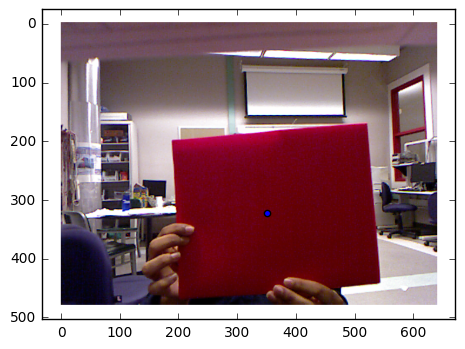

(351, 323)
Image 1
approx len 4


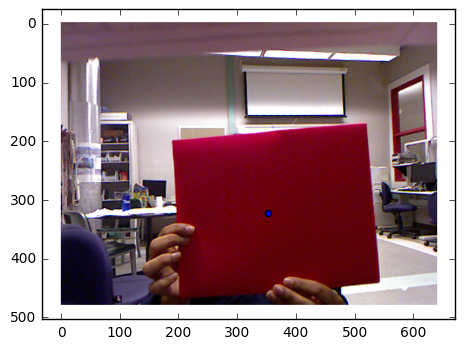

(352, 323)
Image 2
approx len 4


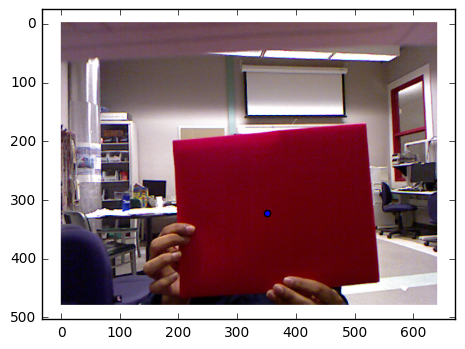

(350, 323)
Image 3
approx len 4


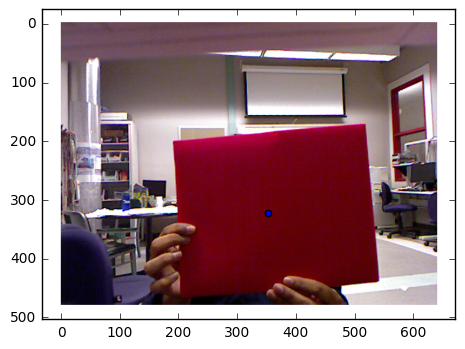

(352, 323)
Image 4
approx len 4


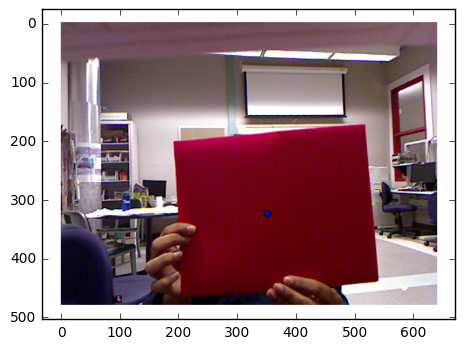

(351, 323)
Image 5
approx len 4


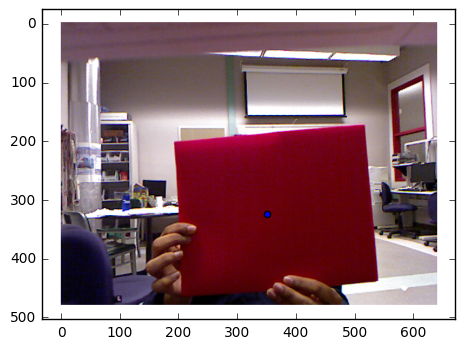

(351, 324)
Image 6
approx len 4


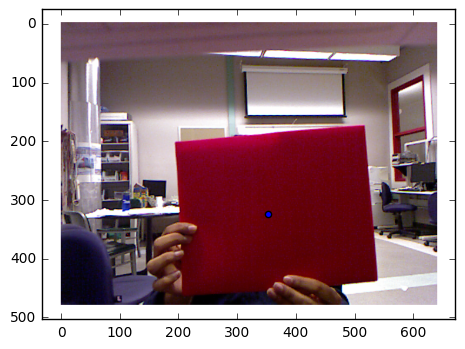

(353, 324)
Image 7
approx len 4


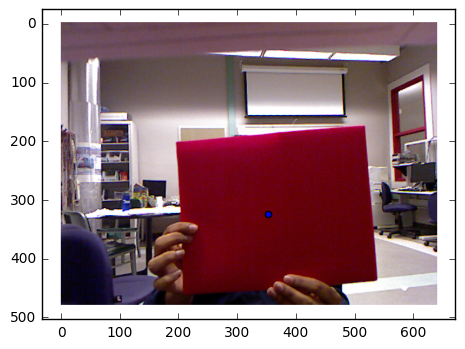

(353, 324)
Image 8
approx len 4


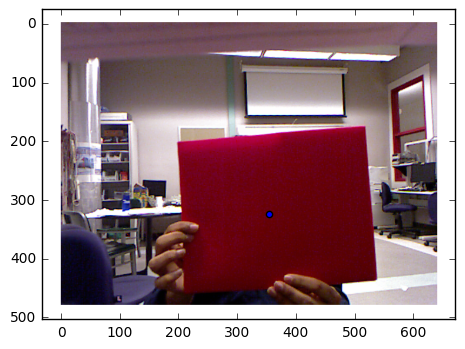

(355, 324)
Image 9
approx len 4


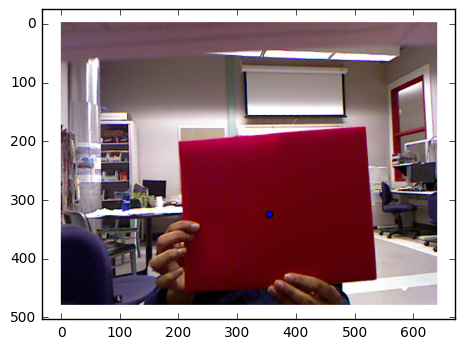

(355, 324)
Image 10
approx len 4


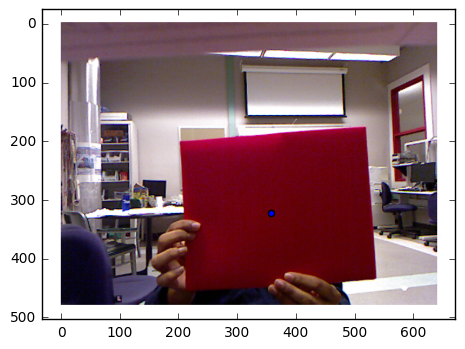

(357, 323)
Image 11
approx len 4


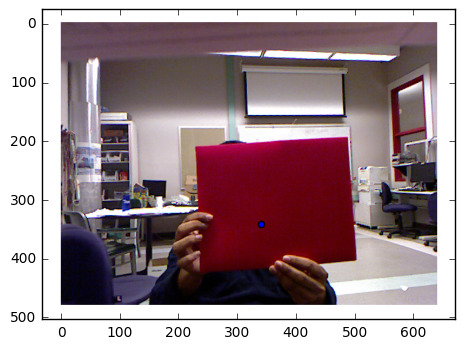

(340, 341)
Image 12
approx len 4


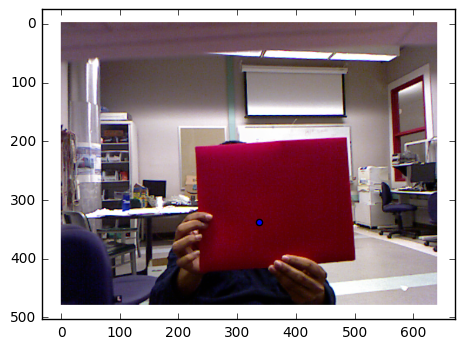

(338, 337)
Image 13
approx len 4


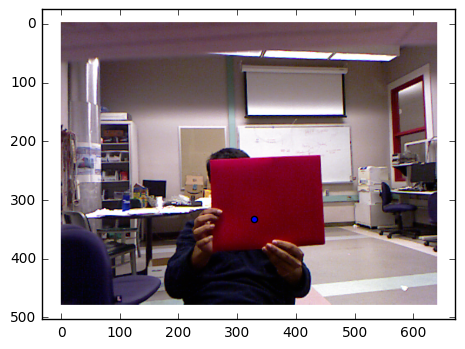

(329, 333)
Image 14
approx len 4


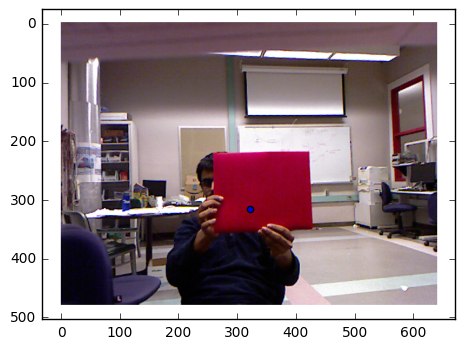

(322, 315)
Image 15
approx len 4


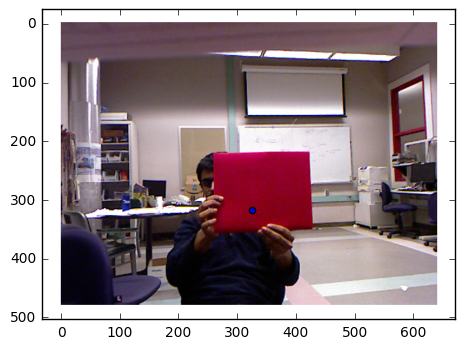

(325, 317)
Image 16
approx len 4


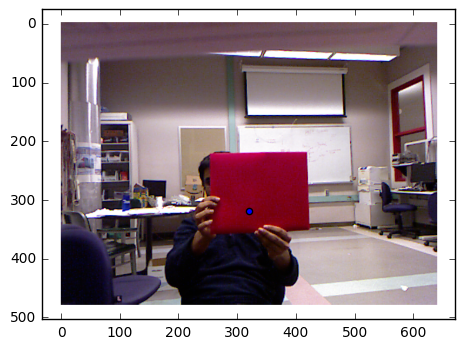

(320, 318)
Image 17
approx len 4


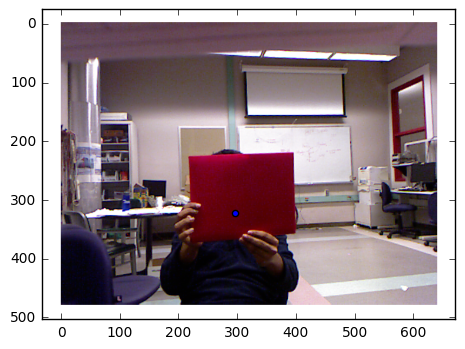

(297, 323)
Image 18
approx len 4


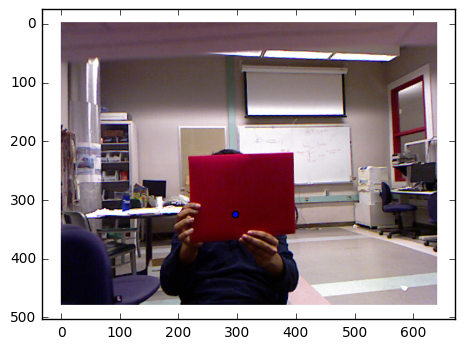

(296, 324)
Image 19
approx len 4


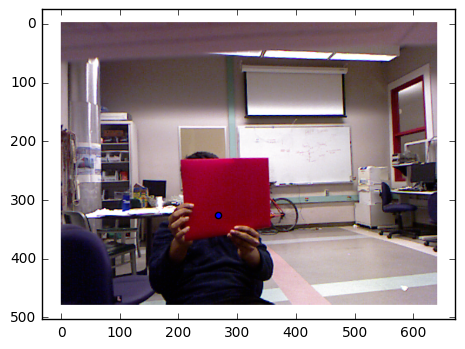

(268, 325)
Image 20
approx len 4


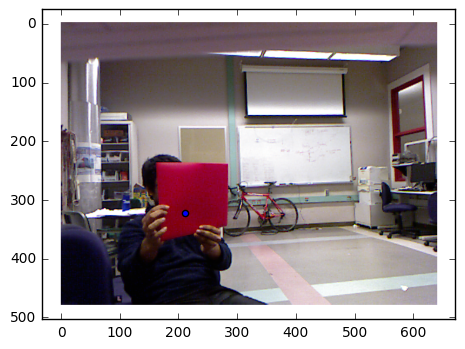

(211, 323)
Image 21
approx len 4


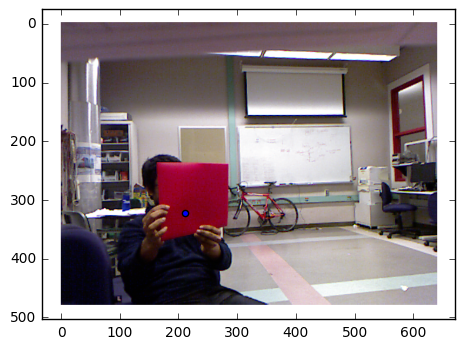

(212, 322)
Image 22
approx len 4


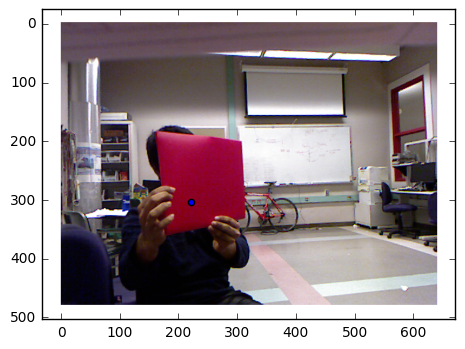

(222, 303)


In [37]:
for i in range(len(int_arrays)):
    image_data = int_arrays[i]
    print("Image " + str(i))
    print(find_target_center(image_data))

approx len 4


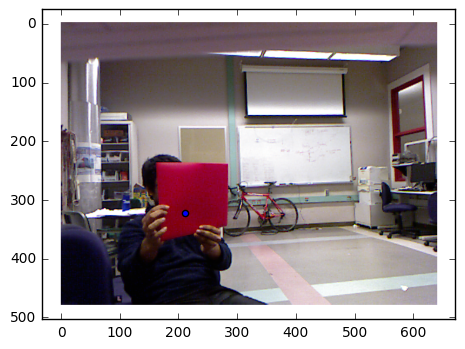

(211, 323)

In [39]:
image_data = int_arrays[20]
find_target_center(image_data)

original img


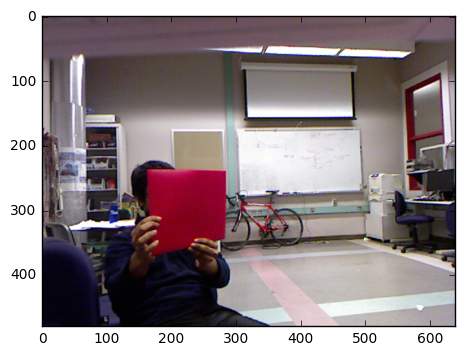

mask


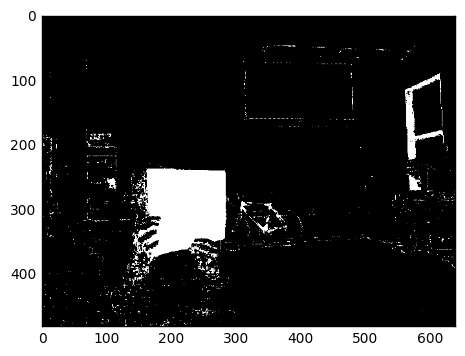

res


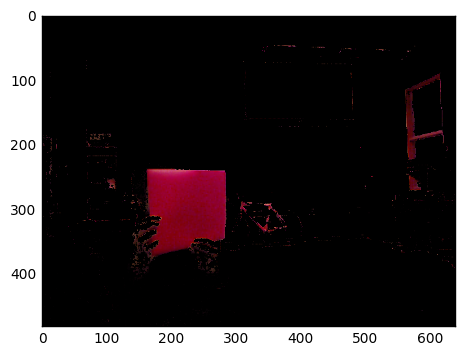

blurred


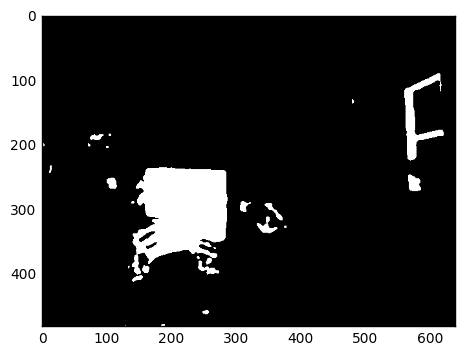

Blob detection


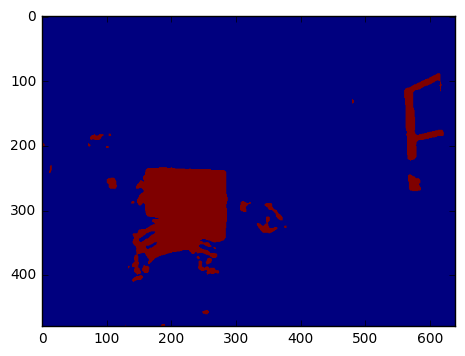

Max cnt
Max contour length:  303
Max contour Area 16627.0


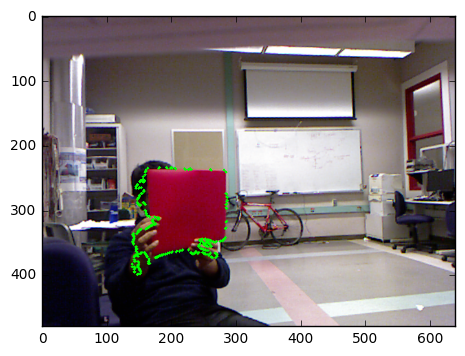

Getting approximation (denoised): 
Epsilon hyper param:  0.04
33.4519420337677
Original approximation len 4
Approximate cnt points [[[281 239]]

 [[160 239]]

 [[142 396]]

 [[270 372]]]


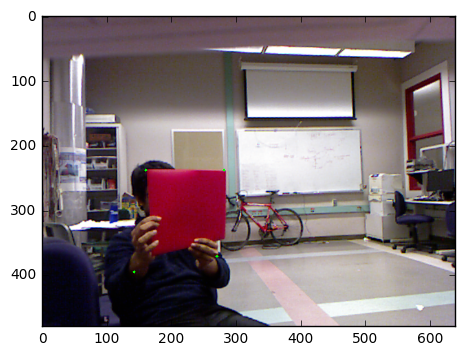

New centroid [[ 213.25  311.5 ]]
New approximation Length:  4


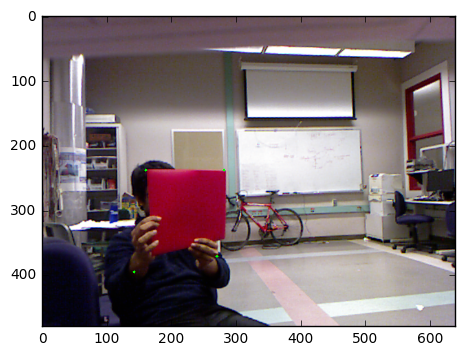

final point
approx len 4


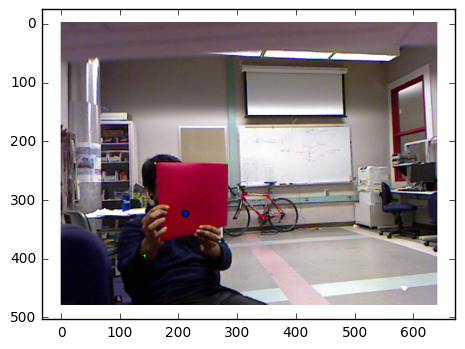

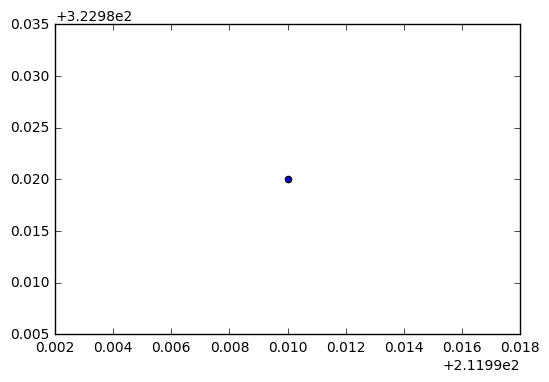

In [43]:
img_cv = np.uint8(int_arrays[20].reshape((480,640,3)))
#img_cv = np.uint8(reshaped)
og_img_cv = img_cv.copy()
hsv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2HSV)

# first mask
lower_red_0 = np.array([0,128,50])
upper_red_0 = np.array([10,255,255])
mask_0 = cv2.inRange(hsv, lower_red_0, upper_red_0)

# second mask
lower_red_1 = np.array([160,128,0])
upper_red_1 = np.array([180,255,255])
mask_1 = cv2.inRange(hsv, lower_red_1, upper_red_1)

mask = cv2.bitwise_or(mask_0, mask_1)

res = cv2.bitwise_or(img_cv,img_cv, mask= mask)


print("original img")
plt.imshow(conv_img(img_cv))
plt.show()

print("mask")
plt.imshow((mask), cmap="gray")
plt.show()

print("res")
plt.imshow(conv_img(res))
plt.show()

print("blurred")
blurred = cv2.GaussianBlur(mask, (13, 13), 0)
thresh = cv2.threshold(blurred, 70, 255, cv2.THRESH_BINARY)[1]
 
plt.imshow(thresh, cmap="gray")
plt.show()

# find contours in the thresholded image
im2, contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
max_contours = (np.array([cv2.contourArea(cnt) for cnt in contours]))
max_cnt_idx = np.argmax(max_contours)
max_cnt = contours[max_cnt_idx]
#epsilon = 0.01 * cv2.arcLength(max_cnt,True)
#max_cnt = cv2.approxPolyDP(max_cnt,epsilon,True)

"""
max_cnt_cvHull = cv2.convexHull(max_cnt)
#cv2.drawContours(img_cv, max_cnt, -1, (0,255,0), 3)
#kmeans_lines = kmeans(max_cnt)
try:
    lines = (gen_rect(max_cnt_cvHull))
    corners = get_corners(lines)

    print("contour")
    img_cv_contour_copy = img_cv.copy()
    cv2.drawContours(img_cv_contour_copy, max_cnt_cvHull, -1, (0,255,0), 3)
    plt.imshow(conv_img(img_cv_contour_copy))
    plt.show()

    print("with lines")
    for line in lines:
        pt1 = line[0]
        pt2 = line[1]
        cv2.line(img_cv, (pt1[0], pt1[1]), (pt2[0], pt2[1]), (255,0,0), 5)
    print("num_corners", len(corners))
    plt.scatter(corners[:,0], corners[:,1], color='yellow')

    plt.imshow(conv_img(img_cv))
    plt.show()
except:
    pass
"""

# TRYING USING BLOB DETECTION
print("Blob detection")
img_cv_copy = og_img_cv.copy()
detector = cv2.SimpleBlobDetector_create()
keypoints = detector.detect(thresh)
im_with_keypoints = cv2.drawKeypoints(img_cv_copy, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(thresh)
plt.show()


# PLOTTING MAX CONTOUR

print("Max cnt")
print("Max contour length: ", len(max_cnt))
print("Max contour Area", cv2.contourArea(max_cnt))
img_cv_copy = og_img_cv.copy()
cv2.drawContours(img_cv_copy, max_cnt, -1, (0,255,0), 3)
plt.imshow(conv_img(img_cv_copy))
#x,y = find_target_center(og_img_cv)
#plt.scatter([x],[y])
plt.show()


# USING ONE POLYNOMIAL APPROXIMATION

print("Getting approximation (denoised): ")
img_cv_copy = og_img_cv.copy()
peri = cv2.arcLength(max_cnt, True)
eps = .04
print("Epsilon hyper param: ", .04)
print(eps * peri)
approx = cv2.approxPolyDP(max_cnt, eps * peri, True)

# PLOTTING ONE POLYNOMIAL APPROXIMATION

print("Original approximation len", len(approx))
print("Approximate cnt points", approx)
img_cv_copy = og_img_cv.copy()
cv2.drawContours(img_cv_copy, approx, -1, (0,255,0), 3)
plt.imshow(conv_img(img_cv_copy))
#x,y = find_target_center(og_img_cv)
#plt.scatter([x],[y])
plt.show()

# TUNING POLYNOMIAL APPROXIMATION

delta = 10
for _ in range(500):
    if len(approx) == 4:
        break
    elif len(approx) > 4:
        eps *= delta
        approx = cv2.approxPolyDP(max_cnt, eps * peri, True)
        delta -= 1
        delta /= 1.02
        delta += 1
    elif len(approx) < 4:
        eps /= delta
        approx = cv2.approxPolyDP(max_cnt, eps * peri, True)
        delta -= 1
        delta /= 1.02
        delta += 1

print("New centroid", np.mean(approx, axis=0))
print("New approximation Length: ", len(approx))
img_cv_copy = og_img_cv.copy()
cv2.drawContours(img_cv_copy, approx, -1, (0,255,0), 3)
plt.imshow(conv_img(img_cv_copy))
#x,y = find_target_center(og_img_cv)
#plt.scatter([x],[y])
plt.show()

print("final point")
img_cv_copy = og_img_cv.copy()
cv2.drawContours(img_cv_copy, approx, -1, (0,255,0), 3)
plt.imshow(conv_img(img_cv))
target_center = find_target_center(img_cv_copy)
if target_center != "NaN":
    x, y = target_center
    plt.scatter([x],[y])
    plt.show()
else:
    print("NO POINT!!")

# Face detection 

In [28]:
filename = "/home/girish/Documents/data/ee106a/red_folder1.txt"
textfile = open(filename, 'r')
filetext = textfile.read()
textfile.close()

print("Length of file: ")
print(len(filetext))

matches = re.findall("data\: \[[^\]]+\]", filetext)

str_arrays = [i[6:] for i in matches]

print("Number of frames: ")
print(len(str_arrays))

int_arrays = [np.array(json.loads(i)) for i in str_arrays]

Length of file: 
16590112
Number of frames: 
4


W H 64009
(187.5, 281.5)


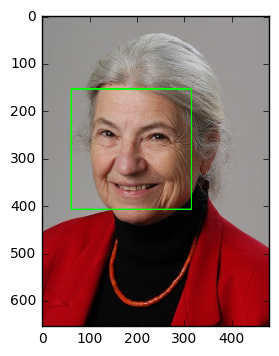

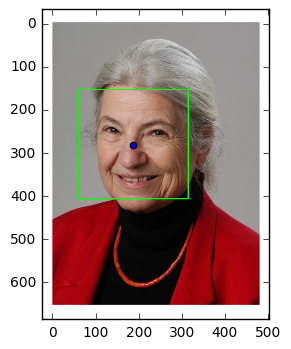

In [62]:
cv_img = cv2.imread("/home/girish/Documents/data/ee106a/ruzena-bajcsy.png")
out = get_face_centroid(cv_img, from_kinect=False)
a,b = out.split(" ")
x = float(a)
y = float(b)
plt.imshow(conv_img(cv_img))
plt.scatter([x], [y])
plt.show()

In [58]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
image_data = int_arrays[i]
def get_face_centroid(image_data, from_kinect=True):
    
    if from_kinect:
        img_cv = np.uint8(image_data.reshape((480,640,3)))
    else:
        img_cv = image_data
    
#    img_cv = np.uint8(image_data.reshape((480,640,3)))

    frame = img_cv

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    

    faces = face_cascade.detectMultiScale(
       gray,
       scaleFactor=1.1,
       minNeighbors=5,
       minSize=(30, 30),
       flags = cv2.CASCADE_SCALE_IMAGE #flags = cv2.cv.CV_HAAR_SCALE_IMAGE
    )

    if len(faces) == 0:
        return "nan"
    
    max_face_area = -1
    max_face_centroid = None
    # Draw a rectangle around the faces
    for (x, y, w, h) in faces:
        #print("W H", w * h)
        #print((x + w/2.0, y + h/2.0))
        if w * h > max_face_area:
            max_face_area = w * h
            max_face_centroid = (x + w/2.0, y + h/2.0)
        #cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)
    #plt.imshow(conv_img(frame))
    #plt.show()
    return str(max_face_centroid[0]) + " " + str(max_face_centroid[1])

In [42]:
def plot_face_detection(image_data, from_kinect=True):
    #image_data = int_arrays[i]
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
    if from_kinect:
        img_cv = np.uint8(image_data.reshape((480,640,3)))
    else:
        img_cv = image_data
    frame = img_cv

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    faces = face_cascade.detectMultiScale(
       gray,
       scaleFactor=1.1,
       minNeighbors=5,
       minSize=(30, 30),
       flags = cv2.CASCADE_SCALE_IMAGE #flags = cv2.cv.CV_HAAR_SCALE_IMAGE
    )

    # Draw a rectangle around the faces
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(conv_img(frame))
    plt.show()

Image 0


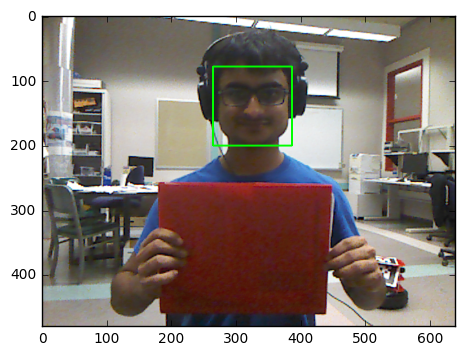

Image 1


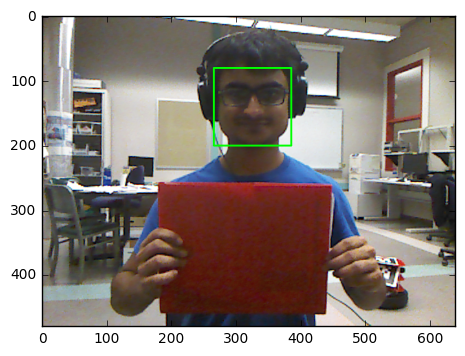

Image 2


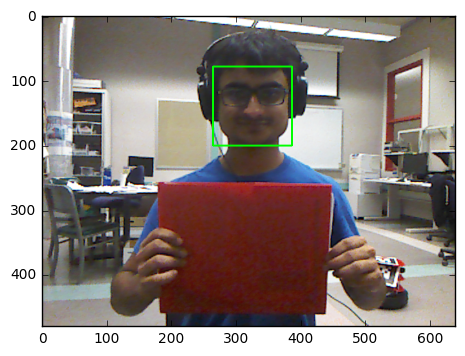

Image 3


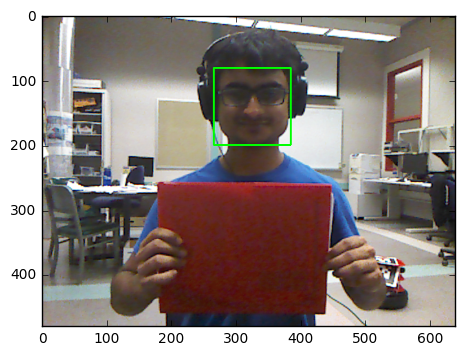

In [32]:
for i in range(len(int_arrays)):
    image_data = int_arrays[i]
    img_cv = np.uint8(image_data.reshape((480,640,3)))
    print("Image " + str(i))
    #plt.imshow(conv_img(img_cv))
    #plt.show()
    plot_face_detection(image_data)

In [63]:
pass
print("hi")

hi


In [ ]:
if (np.isnan(last_depth)):
                last_depth = depth_pos
        diff_from_last_depth = last_depth - depth_pos
        if (diff_from_last_depth > 0.5):
                depth_pos = 0
        else:
                last_depth = depth_pos
        if (np.isnan(depth_pos) or np.isnan(x_pos) or depth_pos < min_z or depth_pos  > max_z):
                speed.linear.x = 0
                speed.linear.y = 0
                speed.angular.z = 0


```
rather small
AREA 18856.0
slanted
AREA 17291.0
normal
AREA 26244.0
huge
AREA 98381.0
maybe  a meter away
AREA 16627.0
no red folder
AREA 3266.0
```

In [165]:
np.linspace(100, 400, 1)

array([ 100.])

``` 
Links
https://stackoverflow.com/questions/44127342/detect-card-minarea-quadrilateral-from-contour-opencv
https://stackoverflow.com/questions/15351616/find-corner-points-of-a-quadrilateral-from-set-of-points
```

### trying to use gray scale and contouring [not working]

In [166]:
img_cv = np.uint8(int_arrays[1].reshape((480,640,3)))
http://localhost:8888/notebooks/ee106a/final-project/Untitled.ipynb#
# convert the resized image to grayscale, blur it slightly,
# and threshold it
gray = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
thresh = cv2.threshold(blurred, 50, 255, cv2.THRESH_BINARY)[1]
 
plt.imshow(blurred, cmap="gray")
plt.show()

# find contours in the thresholded image and initialize the
# shape detector
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#cnts = cnts[0] if imutils.is_cv2() else cnts[1]
plt.imshow(cnts[0])
plt.show()

SyntaxError: invalid syntax (<ipython-input-166-2d9e4a6b4ac6>, line 2)

### trying to use scipy ndimage [not working]

In [ ]:
objs = ndimage.find_objects(img_cv, max_label=1)
img_1 = img_cv[objs[0]]
print(img_1.shape)
plt.imshow(conv_img(img_1))
plt.show()

### manual filtering cell by cell with my own thresholds [got basic filtering and centroid detection kinda working]

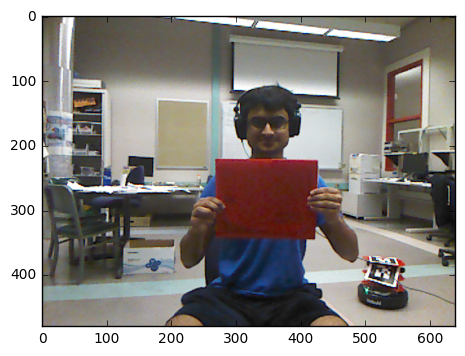

[[67 59 60]
 [67 59 60]
 [71 65 68]
 [75 67 70]
 [78 71 72]
 [81 73 73]
 [85 75 73]
 [88 75 76]
 [89 77 78]
 [90 81 77]]


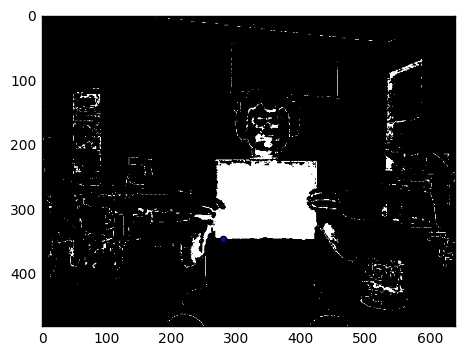

In [55]:
def filter_img_rgb(img_data):
    img_cv = np.uint8(img_data.reshape((480,640,3)))
    plt.imshow(conv_img(img_cv))
    plt.show()

    img_np = conv_img(img_cv)

    curr_img = img_np.copy()
    print(curr_img[1,:10])
    curr_ref = np.uint8(np.zeros(curr_img.shape))

    sum_red = np.array([0,0])
    tot_red = 0

    for i in range(curr_img.shape[0]):
        for j in range(curr_img.shape[1]):
            curr_rgb = curr_img[i,j]
            if curr_rgb[0] > 50 and curr_rgb[1] < 50 and curr_rgb[2] < 50:
                sum_red += np.array([i,j])
                tot_red += 1
                curr_ref[i,j] = [255,255,255]
    avg_red = sum_red / tot_red
    #curr_ref = np.ones(curr_img.shape) * 100
    plt.scatter([avg_red[0]], [avg_red[1]])
    plt.imshow(curr_ref)
    plt.show()

# matplot lib online experiment

In [13]:
import numpy as np
import matplotlib.pyplot as plt

plt.axis([0, 10, 0, 1])
plt.ion()

for i in range(10):
    y = np.random.random()
    plt.scatter(i, y)
    plt.pause(0.05)

while True:
    plt.pause(0.05)
 

KeyboardInterrupt: 

In [1]:
def auto_canny(image, sigma=0.33):
    """
    Get edges of an image
    image: grayscale and blurred input image
    edged: canny edge output image
    """
    # compute the median of the single channel pixel intensities
    v = np.median(image)
    
    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
 
    # return the edged image
    return edged

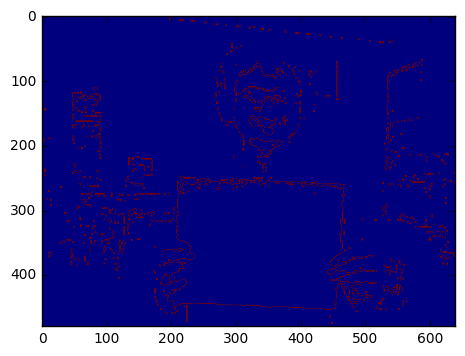

In [195]:
curr_ref_copy = np.uint8(curr_ref)
a = auto_canny(conv_img(curr_ref_copy))
plt.imshow(a)
plt.show()

# First pic

In [50]:
def disp(num):
    reshaped_img = int_arrays[num].reshape((480,640,3))
    colored_reshaped_img = 255 - reshaped_img[:,:,[2,1,0]]
    plt.imshow(colored_reshaped_img)
    plt.show()

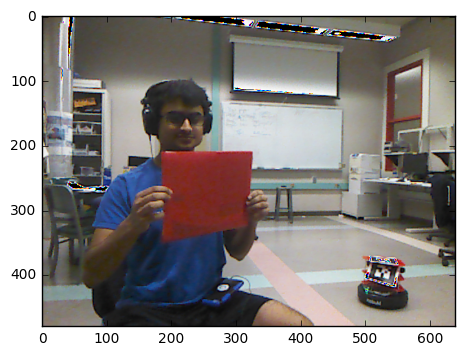

In [51]:
disp(3)

In [ ]:
disp(9)

In [ ]:
# Read image
im = cv2.imread("Drawing.png", cv2.IMREAD_GRAYSCALE)
 
# Set up the detector with default parameters.
detector = cv2.SimpleBlobDetector_create()
 
# Detect blobs.
keypoints = detector.detect(im)
 
# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
 
# Show keypoints
cv2.imshow("Keypoints", im_with_keypoints)
#cv2.waitKey(0)

In [57]:
int_arrays[1][:10]

array([117, 133, 131, 117, 133, 131,  92, 124, 137, 142])

In [16]:
int_arrays[5][:10]

array([122, 125, 131, 122, 125, 131,  97, 115, 136, 141])

In [19]:
int_arrays[9][:10]

array([120, 110, 126, 120, 110, 126, 105, 118, 134, 146])

```
 sudo pip install opencv-contrib-python
 ```
 